# imports

In [1]:
%load_ext autoreload

In [2]:
%autoreload 2

In [3]:
import pandas as pd
import csv
#import pyedflib
import heartbeat as hb
import preparation_hypno as preph
import preparation_edf as prepedf
import neurokit2 as nk
import matplotlib.pyplot as plt
from edfrd import read_header, read_data_records
from preparation_hypno import System
from datetime import time
from datetime import datetime
from datetime import date
from datetime import timedelta
import edfrd
from neurokit2.hrv.hrv_utils import _hrv_get_rri
#from pyedflib.highlevel import anonymize_edf, read_edf

# allocate variables

In [4]:
#Probanden ID
idp = '000'
#öffnen des Hypnogram
hypnofile = "Nihon_hypno_anon.html"
start_of_hypno = '23:09:09'
night = '1'
dia = 'IHS'

In [5]:
dfh = preph.make_df_hypno_all(hypnofile, System.Nihon, start_of_hypno)

In [6]:
dfh

,Time,Stadium
0,23:09:09,Wach
1,23:09:39,Wach
2,23:10:09,Wach
3,23:10:39,Wach
4,23:11:09,Wach
...,...,...
1042,07:50:09,N2
1043,07:50:39,N2
1044,07:51:09,N2
1045,07:51:39,N2


In [7]:
#get the edf and read out header 

In [8]:
file_path = 'Probanden/Nihon Kohden/14092021_anon.edf'

header = read_header(file_path)
header

Header(version='0', local_patient_identification='', local_recording_identification='', startdate_of_recording='00.00.00', starttime_of_recording='23.08.36', number_of_bytes_in_header_record=5120, reserved=None, number_of_data_records=31458, duration_of_a_data_record=1, number_of_signals=19, signals=(SignalHeader(label='EOG Li', transducer_type='Unknown', physical_dimension='uV', physical_minimum=-3200.0, physical_maximum=3200.0, digital_minimum=-32768, digital_maximum=32767, prefiltering='HP:0,300Hz LP:35Hz N:50Hz', nr_of_samples_in_each_data_record=500, reserved=None), SignalHeader(label='EOG Re', transducer_type='Unknown', physical_dimension='uV', physical_minimum=-3200.0, physical_maximum=3200.0, digital_minimum=-32768, digital_maximum=32767, prefiltering='HP:0,300Hz LP:35Hz N:50Hz', nr_of_samples_in_each_data_record=500, reserved=None), SignalHeader(label='F3-A2', transducer_type='Unknown', physical_dimension='uV', physical_minimum=-3200.0, physical_maximum=3200.0, digital_minimum

In [9]:
ecg_channel, fs = prepedf.get_ecg_channel_and_frequency(file_path)
fs

500

# Calculation cutpoints from seperate hypnogram

In [10]:
cutpoints = preph.calculate_cutpoints(dfh, False)
cutpoints

,Time,Stadium
0,23:09:09,Wach
1,23:19:39,N1
2,23:21:09,N2
3,23:33:39,N3
4,23:47:39,N2
...,...,...
108,07:28:39,N1
109,07:30:09,Wach
110,07:30:39,N1
111,07:32:09,N2


In [11]:
diff = preph.calculate_cutpoints_diff(cutpoints)
print(diff)

[630, 90, 750, 840, 30, 1290, 150, 30, 270, 600, 30, 180, 270, 30, 60, 840, 1350, 30, 30, 60, 30, 780, 30, 90, 60, 30, 30, 90, 30, 180, 30, 540, 30, 30, 330, 1380, 360, 1650, 780, 60, 30, 1020, 30, 30, 30, 1260, 210, 120, 390, 60, 570, 30, 60, 60, 30, 30, 150, 60, 90, 60, 1590, 30, 30, 510, 30, 450, 90, 570, 30, 240, 30, 270, 990, 60, 60, 90, 120, 90, 390, 210, 60, 480, 30, 30, 690, 150, 60, 150, 30, 60, 30, 30, 30, 660, 30, 30, 60, 30, 510, 750, 120, 450, 150, 810, 60, 60, 90, 30, 90, 30, 90, 1200]


# cut first diff with difference, diff acts as a pattern for cutting

In [12]:
diff, difference_between = prepedf.difference_between(header,dfh,diff)

0:00:33
33.0
630
<class 'float'>


In [13]:
print(diff)

[663, 90, 750, 840, 30, 1290, 150, 30, 270, 600, 30, 180, 270, 30, 60, 840, 1350, 30, 30, 60, 30, 780, 30, 90, 60, 30, 30, 90, 30, 180, 30, 540, 30, 30, 330, 1380, 360, 1650, 780, 60, 30, 1020, 30, 30, 30, 1260, 210, 120, 390, 60, 570, 30, 60, 60, 30, 30, 150, 60, 90, 60, 1590, 30, 30, 510, 30, 450, 90, 570, 30, 240, 30, 270, 990, 60, 60, 90, 120, 90, 390, 210, 60, 480, 30, 30, 690, 150, 60, 150, 30, 60, 30, 30, 30, 660, 30, 30, 60, 30, 510, 750, 120, 450, 150, 810, 60, 60, 90, 30, 90, 30, 90, 1200]


In [14]:
#get ecg from EDF as stadium sections

In [15]:
ecg_signal = prepedf.get_data_sections(file_path,ecg_channel,diff,False)

In [16]:
#check if length are correct, ecg has to be one longer than diff

In [17]:
print(len(diff))
print(len(ecg_signal))

112
113


In [18]:
print(diff[0])
print(len(ecg_signal[0])/500)
len(ecg_signal[0])

663
663.0


331500

In [19]:
#example plotting for first 3 seconds

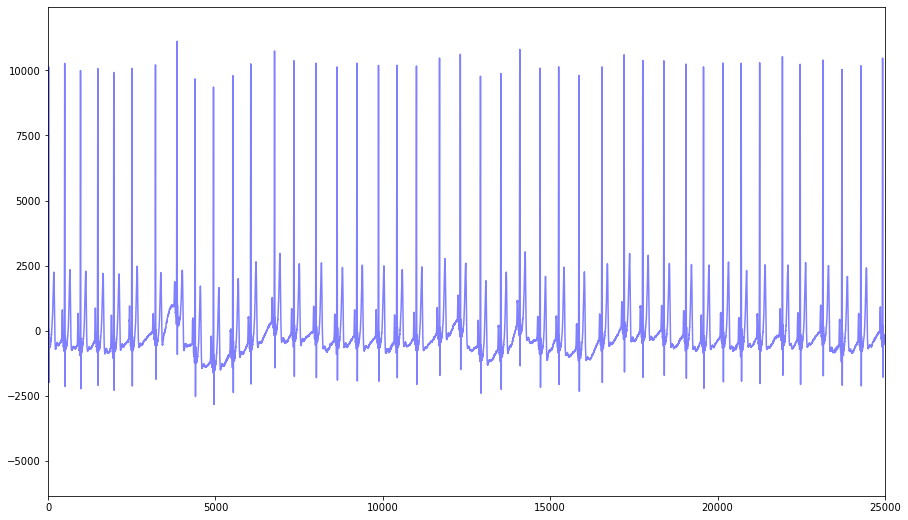

In [20]:
prepedf.plot_raw(ecg_signal[50], 25000)

In [21]:
#Liste anlegen aus Epochen und Stadienbezeichnung
list_of_stad_value = prepedf.list_of_stad_values(ecg_signal, cutpoints)

print(list_of_stad_value[59]['stadium'])

N1


In [22]:
print(len(list_of_stad_value))

113


In [23]:
segments = prepedf.segment_epochs(list_of_stad_value, fs)
len(segments[1]['values'])

150000

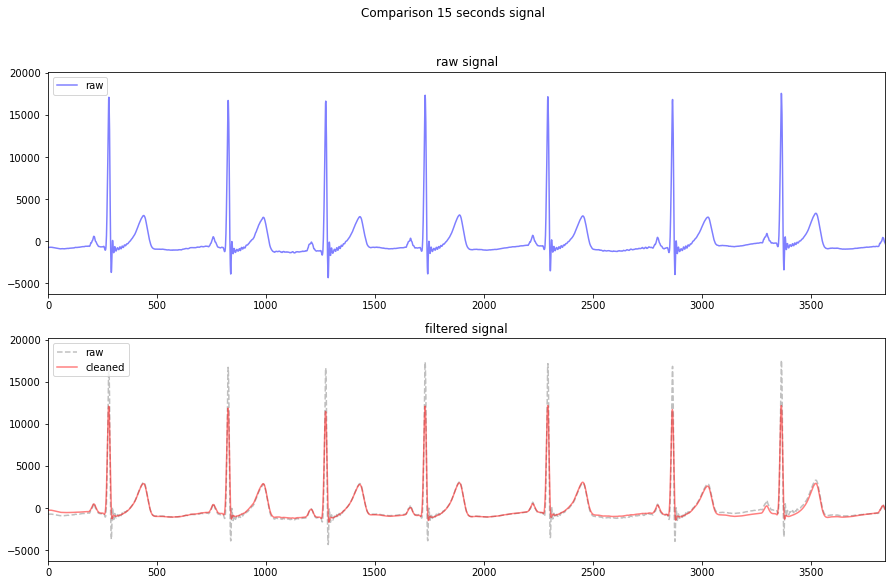

In [24]:
prepedf.plot_compare_signals(segments[8]['values'], fs)

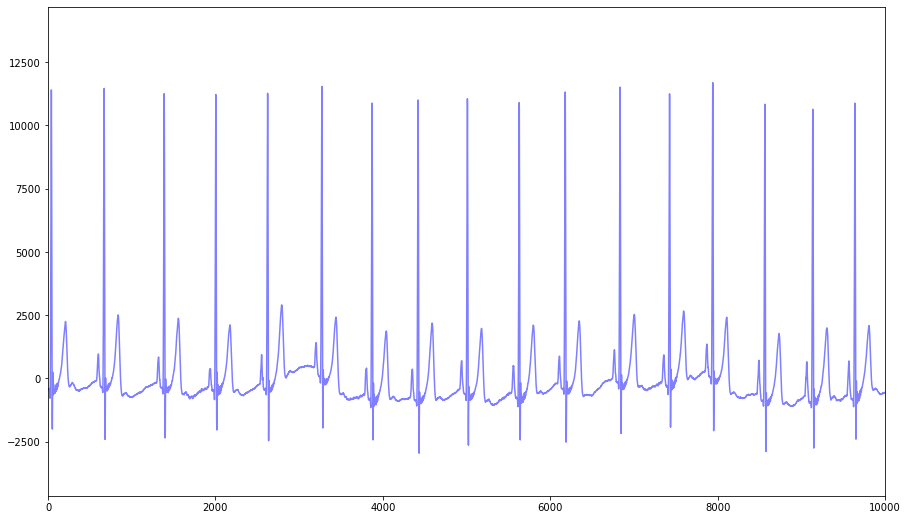

In [25]:
prepedf.plot_raw(segments[40]['values'],10000)

(<Figure size 1080x648 with 1 Axes>,
 {'ectopic': [100, 268], 'missed': [], 'extra': [], 'longshort': [267]})

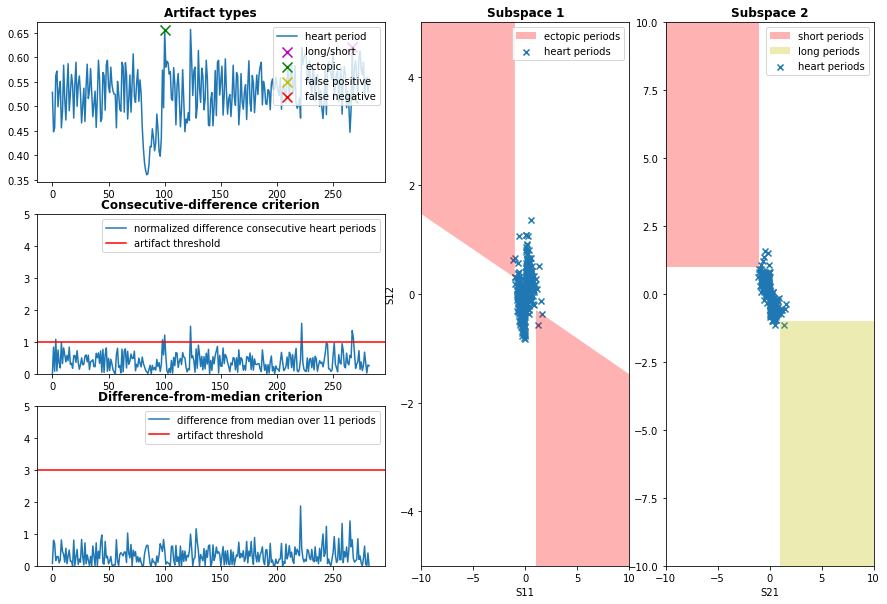

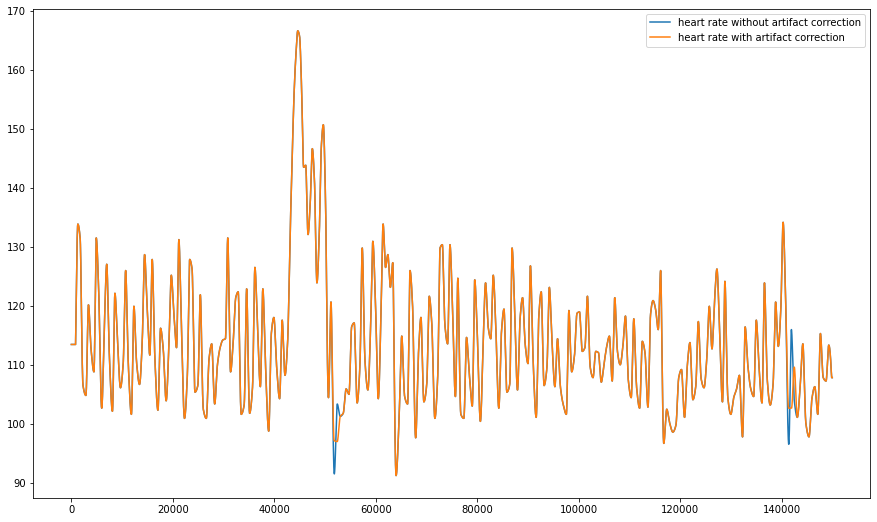

In [26]:
test = segments[8]['values']
peaktest = test[42000:47000]
#for i in test:
 #   if i>70:
  #      test.pop()
len(test)
#sig = nk.signal_simulate(duration=20, sampling_rate=256, frequency=1)
prepedf.compare_peaks(test)

C:\Users\smend\Masterarbeit\neues repo\preparation_edf.py:234: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, (ax0, ax1) = plt.subplots(nrows=2, ncols=1, sharex=True)


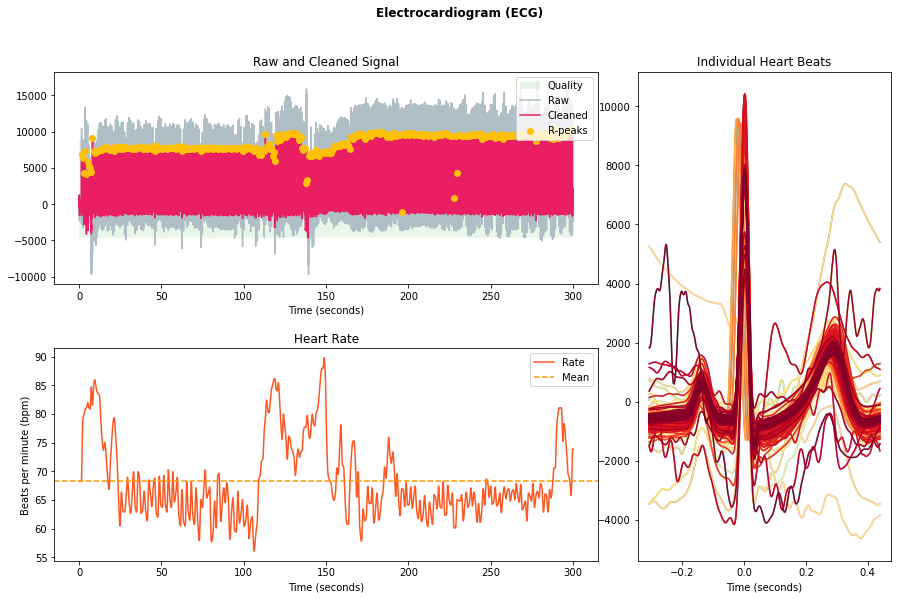

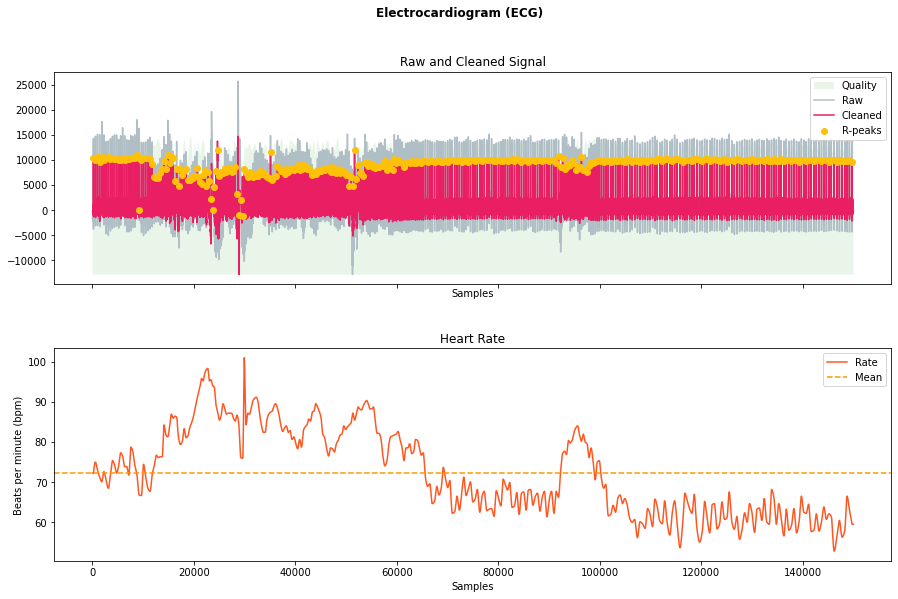

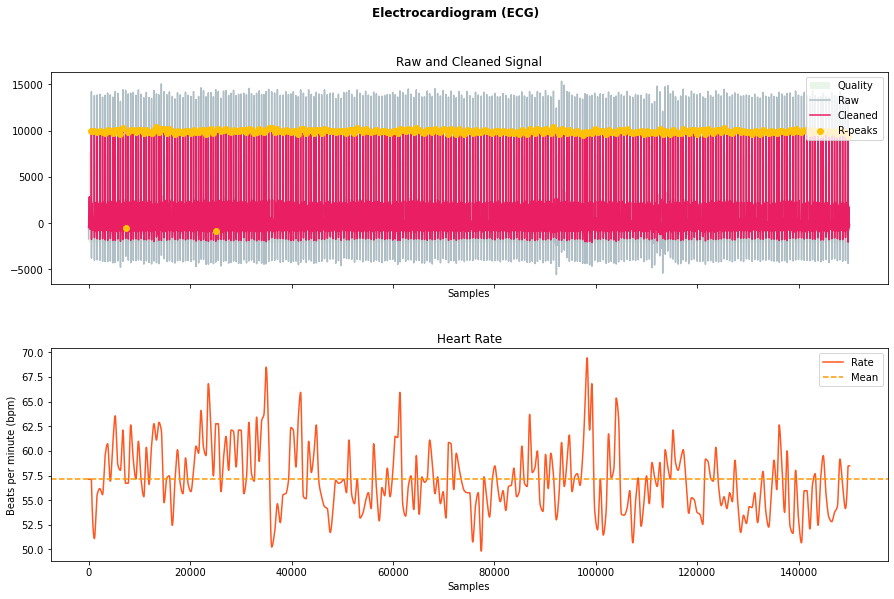

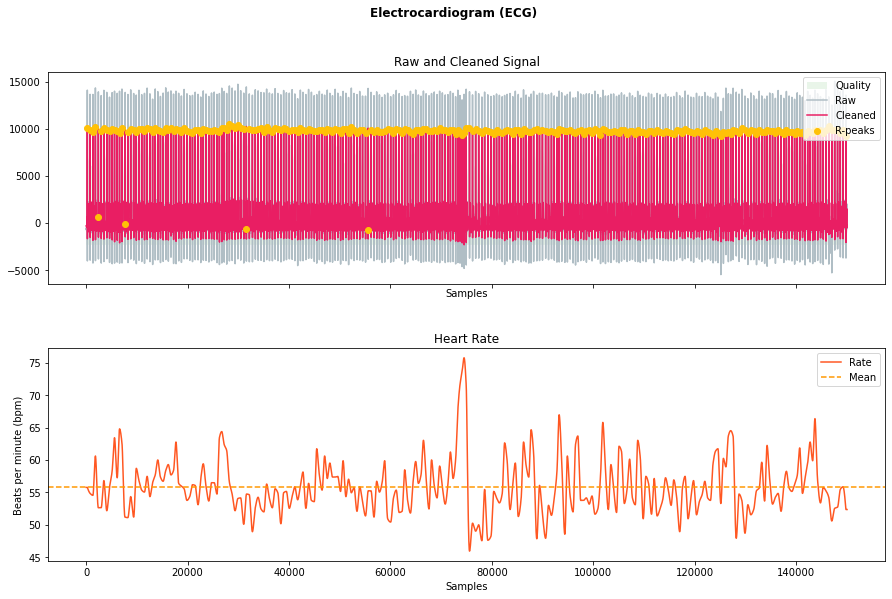

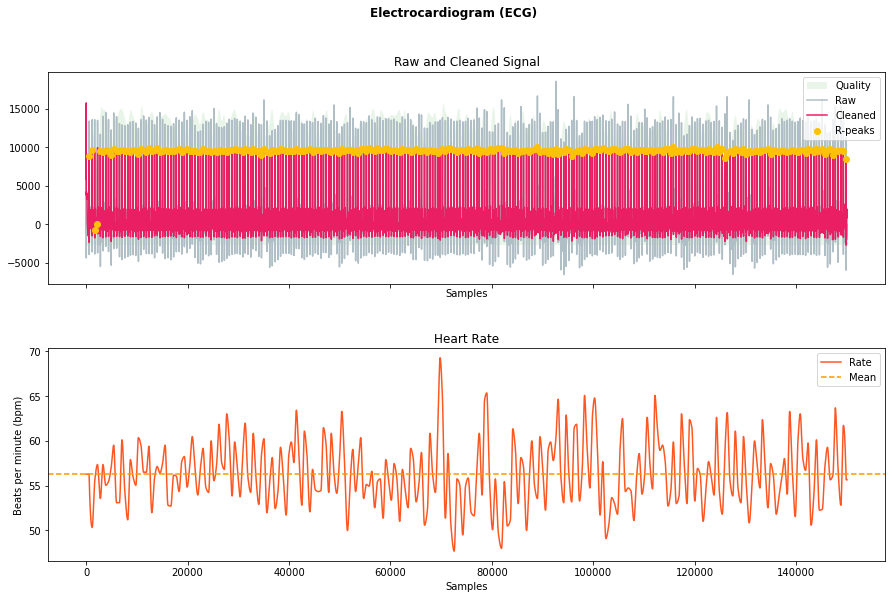

...

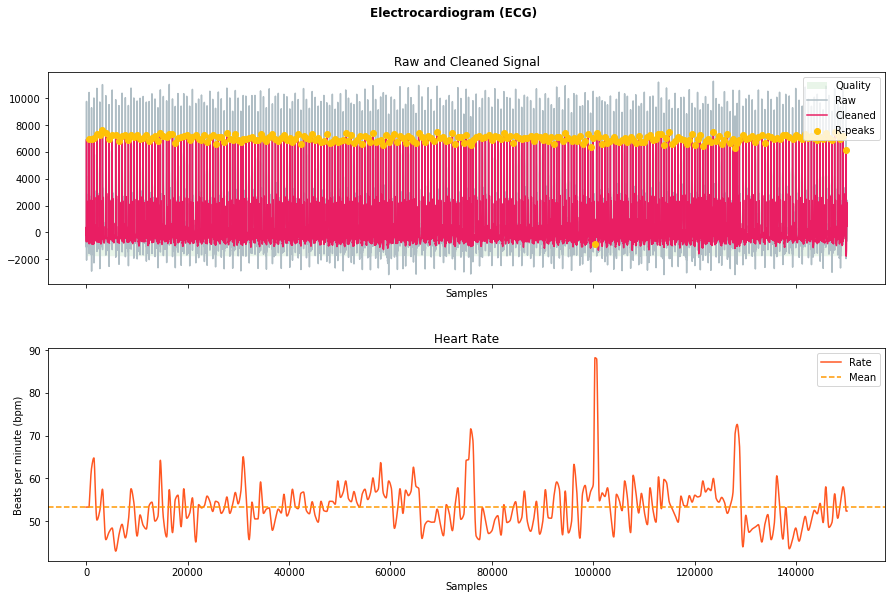

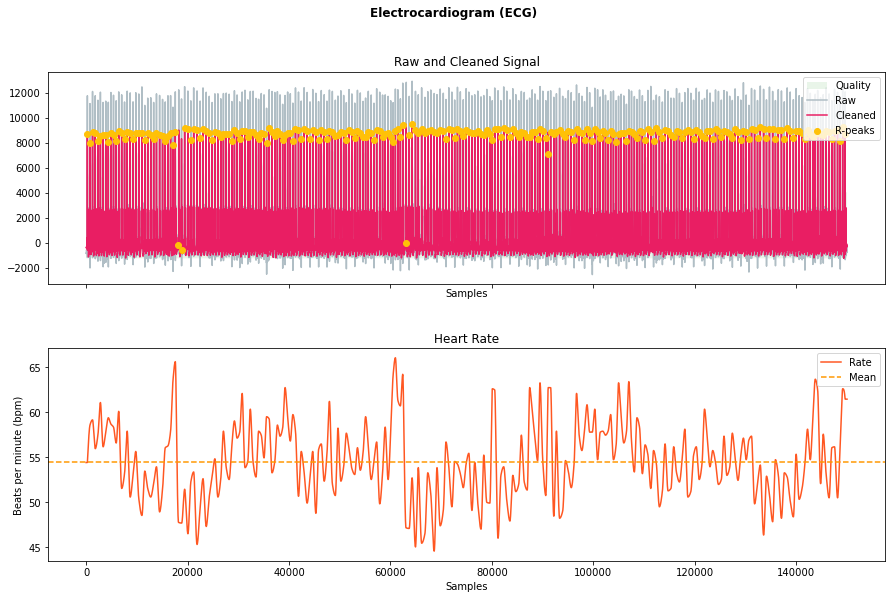

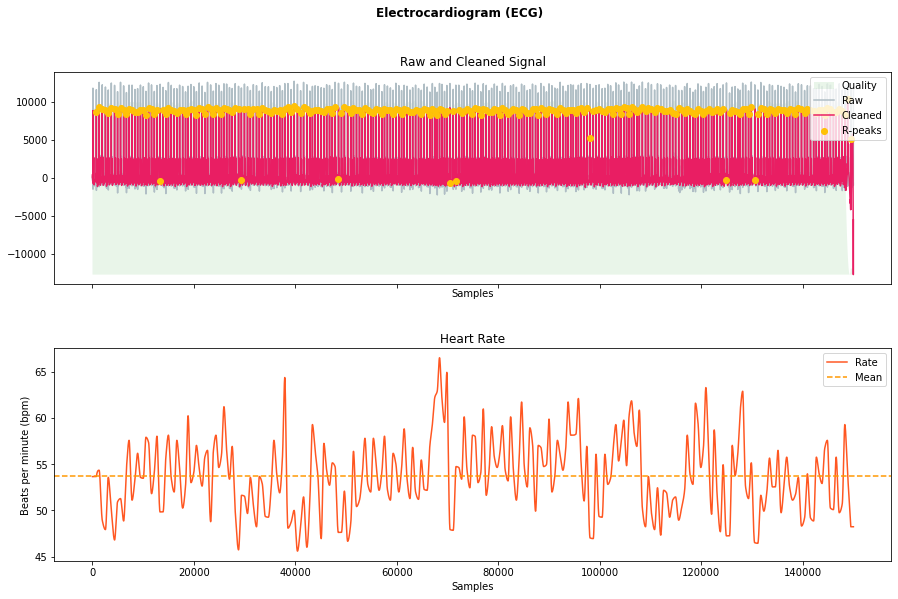

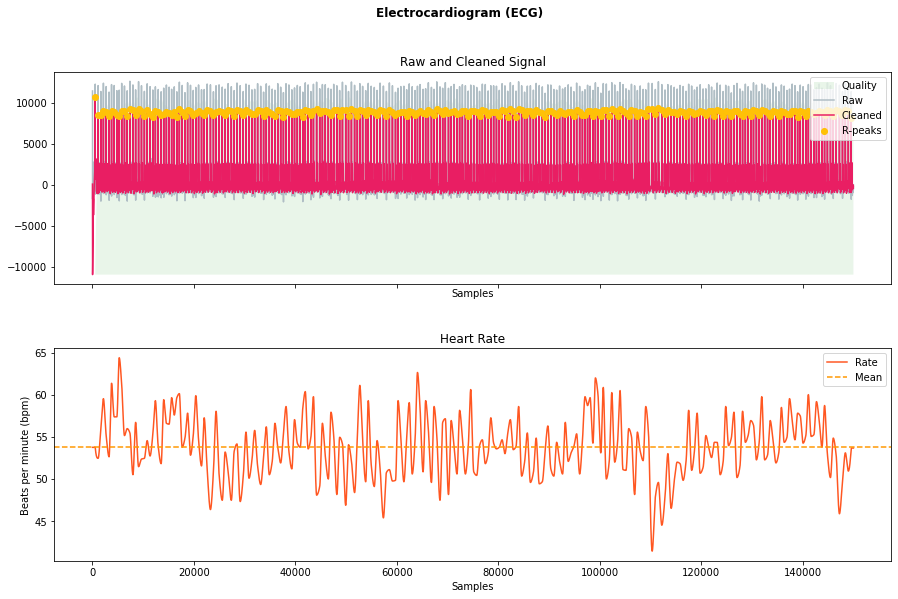

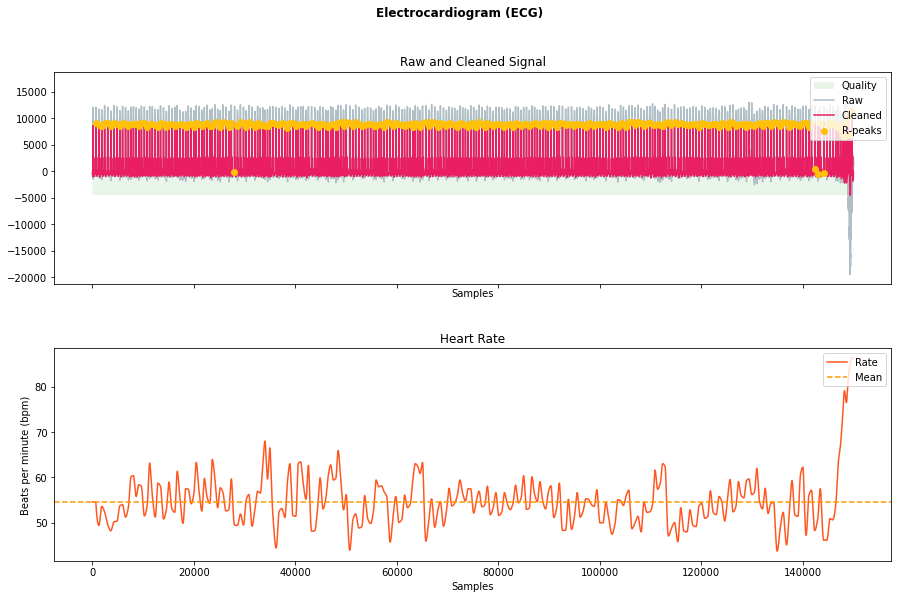

In [27]:
#results
hrv_results,hrv_process,hrv_info = prepedf.analyse_segments(idp, fs, segments, night, dia, True)
#testplot(segment)
#test_analyze(segment)

In [28]:
hrv_results

,stadium,dia,idp,ECG_Rate_Mean,HRV_RMSSD,HRV_MeanNN,HRV_SDNN,HRV_SDSD,HRV_CVNN,HRV_CVSD,...,HRV_Ca,HRV_SDNNd,HRV_SDNNa,HRV_ApEn,HRV_SampEn,HRV_MSE,HRV_CMSE,HRV_RCMSE,HRV_DFA,HRV_CorrDim
0,Wach,IHS,000,68.259712,48.720675,879.309735,85.099359,48.792664,0.096780,0.055408,...,0.526420,58.536980,61.716236,1.077607,1.271433,0.688178,0.922041,1.082502,1.200960,1.368757
1,Wach,IHS,000,72.242458,47.413783,830.772222,123.183914,47.476412,0.148276,0.057072,...,0.533315,84.144349,89.950869,0.813458,0.598089,0.511671,0.715393,0.783508,1.284058,1.132696
2,N2,IHS,000,57.144238,68.464016,1050.408451,61.983031,68.583298,0.059009,0.065178,...,0.497877,43.838351,43.652590,1.108578,2.156475,0.997586,1.613883,1.522462,0.697230,1.639459
3,N2,IHS,000,55.816806,90.548429,1075.856115,80.146127,90.712123,0.074495,0.084164,...,0.531688,54.905301,58.502543,1.152326,2.012750,0.932199,1.320447,1.164174,0.763140,1.473863
4,N3,IHS,000,56.340989,93.339401,1065.914286,69.412433,93.506231,0.065120,0.087567,...,0.500201,49.013090,49.032816,0.989812,2.210062,0.987750,1.120364,1.033383,0.538463,1.641233
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
65,N2,IHS,000,53.363142,121.855354,1126.090566,108.080459,122.084801,0.095978,0.108211,...,0.496245,76.685864,76.112166,1.056352,1.889685,0.963949,1.419649,1.655255,0.648394,1.417051
66,N2,IHS,000,54.484054,98.826147,1102.413284,86.360178,99.009509,0.078337,0.089645,...,0.495485,61.285211,60.734275,1.034776,2.059074,0.928494,1.531098,1.641820,0.935979,1.612366
67,N2,IHS,000,53.699326,96.620479,1118.195489,84.183399,96.801852,0.075285,0.086408,...,0.492628,59.948824,59.071364,0.979889,1.932211,0.953499,1.319450,1.344445,0.826625,1.648500
68,N2,IHS,000,53.794698,99.235499,1116.262172,77.546049,99.422511,0.069469,0.088900,...,0.515395,54.077786,55.769295,1.044534,2.213298,0.970840,1.493114,1.523518,0.925339,1.569637


In [29]:
selected = [1]
hrv_results_clean = prepedf.clean_df_from_bad_signal(hrv_results, idp, night, selected)
hrv_results_clean

,stadium,dia,idp,ECG_Rate_Mean,HRV_RMSSD,HRV_MeanNN,HRV_SDNN,HRV_SDSD,HRV_CVNN,HRV_CVSD,...,HRV_Ca,HRV_SDNNd,HRV_SDNNa,HRV_ApEn,HRV_SampEn,HRV_MSE,HRV_CMSE,HRV_RCMSE,HRV_DFA,HRV_CorrDim
0,Wach,IHS,000,68.259712,48.720675,879.309735,85.099359,48.792664,0.096780,0.055408,...,0.526420,58.536980,61.716236,1.077607,1.271433,0.688178,0.922041,1.082502,1.200960,1.368757
2,N2,IHS,000,57.144238,68.464016,1050.408451,61.983031,68.583298,0.059009,0.065178,...,0.497877,43.838351,43.652590,1.108578,2.156475,0.997586,1.613883,1.522462,0.697230,1.639459
3,N2,IHS,000,55.816806,90.548429,1075.856115,80.146127,90.712123,0.074495,0.084164,...,0.531688,54.905301,58.502543,1.152326,2.012750,0.932199,1.320447,1.164174,0.763140,1.473863
4,N3,IHS,000,56.340989,93.339401,1065.914286,69.412433,93.506231,0.065120,0.087567,...,0.500201,49.013090,49.032816,0.989812,2.210062,0.987750,1.120364,1.033383,0.538463,1.641233
5,N3,IHS,000,56.531828,100.106443,1062.512456,73.517301,100.285213,0.069192,0.094217,...,0.471276,53.504465,50.514133,1.031109,2.052291,0.981734,1.041723,0.939610,0.494340,1.692608
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
65,N2,IHS,000,53.363142,121.855354,1126.090566,108.080459,122.084801,0.095978,0.108211,...,0.496245,76.685864,76.112166,1.056352,1.889685,0.963949,1.419649,1.655255,0.648394,1.417051
66,N2,IHS,000,54.484054,98.826147,1102.413284,86.360178,99.009509,0.078337,0.089645,...,0.495485,61.285211,60.734275,1.034776,2.059074,0.928494,1.531098,1.641820,0.935979,1.612366
67,N2,IHS,000,53.699326,96.620479,1118.195489,84.183399,96.801852,0.075285,0.086408,...,0.492628,59.948824,59.071364,0.979889,1.932211,0.953499,1.319450,1.344445,0.826625,1.648500
68,N2,IHS,000,53.794698,99.235499,1116.262172,77.546049,99.422511,0.069469,0.088900,...,0.515395,54.077786,55.769295,1.044534,2.213298,0.970840,1.493114,1.523518,0.925339,1.569637
